## Exploratory Data Analysis

Import Packages and read data paths

In [437]:
import networkx as nx
from datetime import date
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport

In [438]:
Final_preprocessed = '../data/processed/all_features_with_further_preprocessing.csv'

### Final preprocessed data

In [337]:
df = pd.read_csv(Final_preprocessed)
df=df.drop(columns=['Unnamed: 0'])
df

,paper_id,indegrees_of_cited_papers_sum,indegrees_of_cited_papers_avg,recency_of_cited_papers_avg,max_time_difference_bw_cited_papers,outdegree,outdegrees_of_cited_papers_sum,outdegrees_of_cited_papers_avg,submitter,submission_date,...,submitter_active,submitter_counts,journal_popularity,format_latex,format_revtex,format_harvmac,format_plaintex,date_added_graph,datedelta,citations_till_date
0,9509012,317,31.700000,523.000000,947.0,10,99,9.900000,kiyoshi kamimura <kamimurajpnyitp.bitnet@pucc....,"mon, 04 sep 95 13:59:05 jst (16kb) date (rev...",...,0,4,1,0,0,0,0,1995-08-15,-20.0,2
1,9505051,175,19.444444,146.333333,448.0,9,86,9.555556,ken intriligator <keni@physics.rutgers.edu>,"wed, 10 may 1995 00:36:12 -0400 (10kb)",...,0,3,0,0,0,1,0,1995-05-11,1.0,23
2,9508141,39,6.500000,705.000000,959.0,6,11,1.833333,evansjm@surya11.cern.ch (jonathan evans),"fri, 25 aug 95 19:01:29 +0200 (16kb)",...,0,3,0,1,0,0,0,1995-08-28,3.0,1
3,9508159,222,20.181818,273.272727,909.0,11,116,10.545455,"""a.a. kehagias"" <kehagias@sci.kun.nl>","tue, 29 aug 1995 17:14:24 +0200 (8kb)",...,0,4,0,1,0,0,0,1995-08-30,1.0,20
4,9501050,14,4.666667,357.333333,459.0,3,10,3.333333,igor pesando <pesando@hetws3.nbi.dk>,"fri, 13 jan 1995 15:48:58 +0100 (14kb)",...,0,1,1,1,0,0,0,1995-01-17,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27745,9309045,0,0.000000,0.000000,0.0,0,0,0.000000,hagensenebubecm1.bitnet@frmop11.cnusc.fr,"wed, 08 sep 93 19:43:17 bcn (20kb)",...,0,2,0,0,0,0,0,1993-09-13,5.0,0
27746,9310056,14,2.800000,303.000000,168.0,5,8,1.600000,umeki makoto <umeki@tkyux.phys.s.utokyo.ac.jp>,"mon, 11 oct 93 18:22:35 +0900 (50kb) date (r...",...,0,1,0,0,0,0,0,1993-10-19,8.0,0
27747,9312140,19,4.750000,494.250000,368.0,4,0,0.000000,shahn majid <majid@damtp.cambridge.ac.uk>,"wed, 15 dec 93 19:09:59 gmt (53kb) date (rev...",...,1,13,0,0,0,0,0,1993-12-21,6.0,20
27748,9311065,0,0.000000,0.000000,0.0,0,0,0.000000,dave robertson <dgr@pacific.mps.ohiostate.edu>,"wed, 10 nov 93 19:04:07 est (19kb)",...,1,9,0,0,0,0,1,1993-11-23,13.0,0


In [338]:
df.columns

Index(['paper_id', 'indegrees_of_cited_papers_sum',
       'indegrees_of_cited_papers_avg', 'recency_of_cited_papers_avg',
       'max_time_difference_bw_cited_papers', 'outdegree',
       'outdegrees_of_cited_papers_sum', 'outdegrees_of_cited_papers_avg',
       'submitter', 'submission_date', 'title', 'authors', 'comments',
       'report_no', 'journal_ref', 'abstract', 'submitter_email',
       'submitter_name', 'submitter_details', 'is_revised', 'times_revised',
       'first_submission_datetime', 'first_submission_date', 'num_of_pages',
       'format', 'journal_counts', 'first_365_days', 'label', 'label_name',
       'submitter_active', 'submitter_counts', 'journal_popularity',
       'format_latex', 'format_revtex', 'format_harvmac', 'format_plaintex',
       'date_added_graph', 'datedelta', 'citations_till_date'],
      dtype='object')

In [373]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27750 entries, 0 to 27749
Data columns (total 39 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   paper_id                             27750 non-null  int64  
 1   indegrees_of_cited_papers_sum        27750 non-null  int64  
 2   indegrees_of_cited_papers_avg        27750 non-null  float64
 3   recency_of_cited_papers_avg          27750 non-null  float64
 4   max_time_difference_bw_cited_papers  27750 non-null  float64
 5   outdegree                            27750 non-null  int64  
 6   outdegrees_of_cited_papers_sum       27750 non-null  int64  
 7   outdegrees_of_cited_papers_avg       27750 non-null  float64
 8   submitter                            27750 non-null  object 
 9   submission_date                      27750 non-null  object 
 10  title                                27750 non-null  object 
 11  authors                     

**Subseting the data**

In [302]:
df_s=df.drop(columns=['submitter', 'submission_date', 'title', 'authors','comments','report_no',
                    'abstract','submitter_email','submitter_name','first_submission_datetime',
                    'first_submission_date', 'format', 'submitter_active', 'submitter_counts',
                    'journal_popularity','journal_counts','datedelta'])

In [304]:
df_s = df_s[['paper_id', 'indegrees_of_cited_papers_sum', 'indegrees_of_cited_papers_avg', 'recency_of_cited_papers_avg',
             'max_time_difference_bw_cited_papers', 'outdegree', 'outdegrees_of_cited_papers_sum', 'outdegrees_of_cited_papers_avg',
             'journal_ref', 'submitter_details', 'is_revised', 'times_revised', 'num_of_pages', 'format_latex',
             'format_revtex', 'format_harvmac', 'format_plaintex', 'date_added_graph', 'citations_till_date', 'first_365_days',
             'label', 'label_name']]

### Pandas Profiling

In [305]:
profile = ProfileReport(df_s, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Descriptive Stats

In [351]:
df.describe()

,paper_id,indegrees_of_cited_papers_sum,indegrees_of_cited_papers_avg,recency_of_cited_papers_avg,max_time_difference_bw_cited_papers,outdegree,outdegrees_of_cited_papers_sum,outdegrees_of_cited_papers_avg,is_revised,times_revised,...,label,submitter_active,submitter_counts,journal_popularity,format_latex,format_revtex,format_harvmac,format_plaintex,datedelta,citations_till_date
count,2.775000e+04,27750.000000,27750.000000,27750.000000,27750.000000,27750.000000,27750.000000,27750.000000,27750.000000,27750.000000,...,27750.000000,27750.000000,27750.000000,27750.000000,27750.000000,27750.000000,27750.000000,27750.000000,27750.000000,27750.000000
mean,6.094378e+06,867.428793,43.383695,698.085836,1287.096216,12.713225,269.329730,12.523948,0.437081,0.614162,...,0.851315,0.398342,5.574847,0.512721,0.500036,0.075459,0.055748,0.030739,-0.771099,30.370054
std,4.582243e+06,1649.382201,70.665882,530.148573,1168.379996,15.969878,475.212783,13.921731,0.496034,0.842872,...,0.748695,0.489565,6.798978,0.499847,0.500009,0.264136,0.229438,0.172612,102.750671,175.906409
min,1.001000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-7795.000000,0.000000
25%,2.041092e+05,8.000000,3.000000,327.483696,267.000000,2.000000,4.000000,1.500000,0.000000,0.000000,...,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,9.405184e+06,114.000000,14.303846,600.951613,1094.500000,8.000000,61.000000,8.066667,0.000000,0.000000,...,1.000000,0.000000,3.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,9.705204e+06,1072.000000,57.210663,978.482143,2029.000000,18.000000,358.000000,20.847902,1.000000,1.000000,...,1.000000,1.000000,7.000000,1.000000,1.000000,0.000000,0.000000,0.000000,3.000000,9.000000
max,9.912293e+06,32467.000000,956.600000,9024.000000,9055.000000,562.000000,13715.000000,562.000000,1.000000,14.000000,...,3.000000,1.000000,61.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1293.000000,6166.000000


In [368]:
df2 = df.skew()
print(df2)

paper_id                               -0.532262
indegrees_of_cited_papers_sum           4.039220
indegrees_of_cited_papers_avg           3.593683
recency_of_cited_papers_avg             1.217268
max_time_difference_bw_cited_papers     1.152354
outdegree                               5.328970
outdegrees_of_cited_papers_sum          5.049477
outdegrees_of_cited_papers_avg          4.246706
is_revised                              0.253706
times_revised                           1.733849
num_of_pages                           37.416584
journal_counts                          2.054564
first_365_days                         10.229102
label                                   0.972745
submitter_active                        0.415327
submitter_counts                        3.842711
journal_popularity                     -0.050902
format_latex                           -0.000144
format_revtex                           3.214792
format_harvmac                          3.872803
format_plaintex     

C:\Users\Sharan Shyamsundar\AppData\Local\Temp\ipykernel_29772\693763020.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df2 = df.skew()


In [379]:
plt.rcParams.update({"figure.figsize" : (12, 8),
                     "axes.facecolor" : "white",
                     "axes.edgecolor":  "black",
                     'font.size': 30})

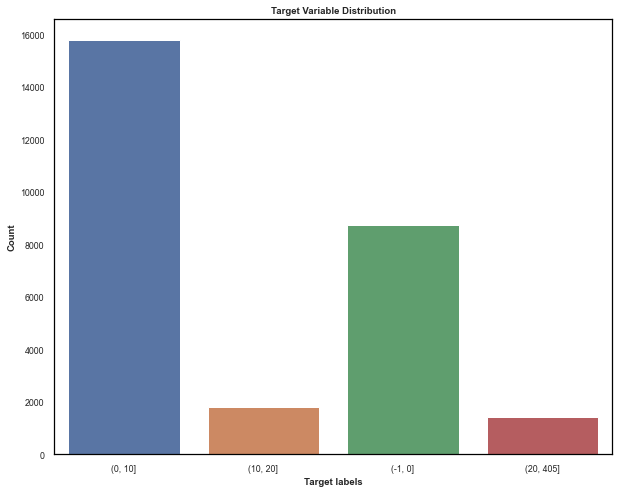

In [408]:
sns.countplot(x ='label_name', data = df)
plt.title('Target Variable Distribution', fontweight='bold')
plt.xlabel('Target labels', fontweight='bold')
plt.ylabel('Count', fontweight='bold')
#plt.savefig("../reports/figures/class_count.png")
 
# Show the plot
plt.show()

### Correlation Plots

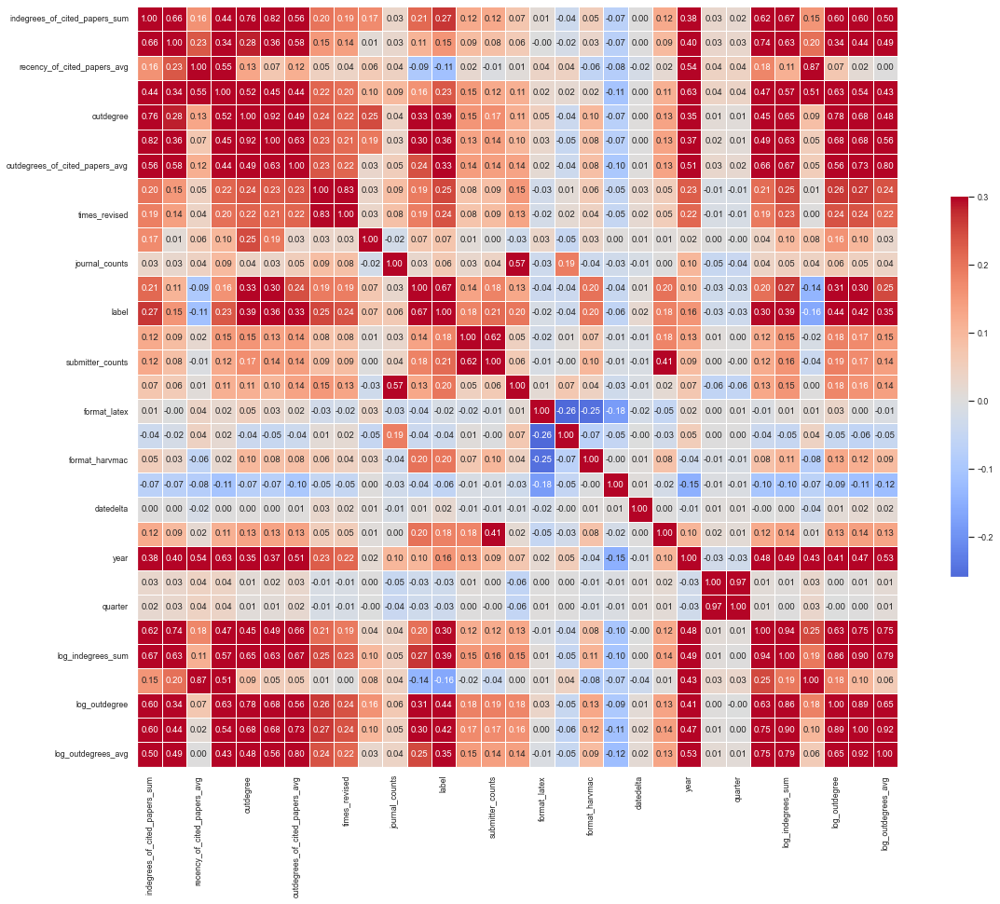

In [319]:
corr = df.drop(columns=['paper_id']).corr()
g = sns.heatmap(corr,  vmax=.3, center=0,
                square = True, linewidths=.5,
                cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
sns.despine()
g.figure.set_size_inches(20,15)
plt.show()

Graph Related Features

In [320]:
df_graph = df[['paper_id', 'indegrees_of_cited_papers_sum', 'indegrees_of_cited_papers_avg', 'recency_of_cited_papers_avg',
               'max_time_difference_bw_cited_papers', 'outdegree','outdegrees_of_cited_papers_sum',
               'outdegrees_of_cited_papers_avg', 'first_365_days', 'label']]

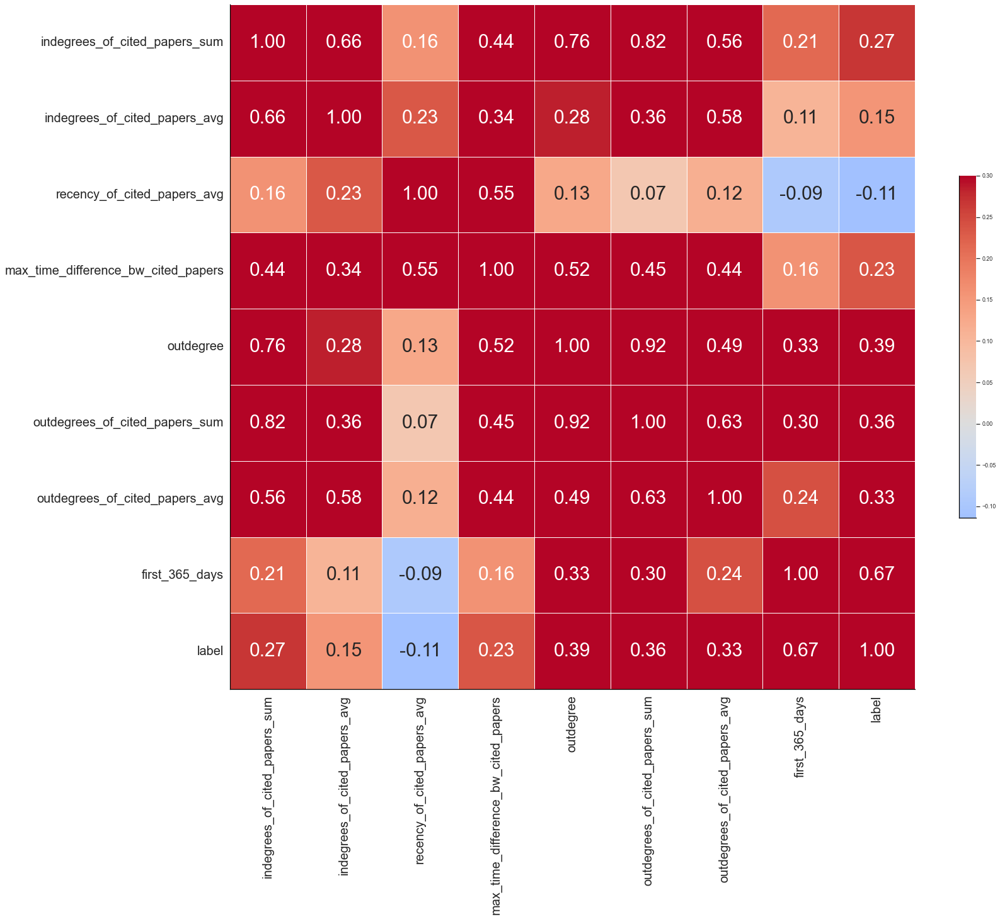

In [407]:
corr = df_graph.drop(columns=['paper_id']).corr()
g = sns.heatmap(corr,  vmax=.3, center=0,
                square = True, linewidths=.5,
                cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
sns.despine()
g.figure.set_size_inches(25,20)
g.set_xticklabels(g.get_xmajorticklabels(), fontsize = 20)
g.set_yticklabels(g.get_ymajorticklabels(), fontsize = 20)
plt.show()
#g.figure.savefig("../reports/figures/graph_features_corr.png")

Metadata related Features

In [324]:
df_metadata = df[['paper_id','submitter', 'submission_date', 'title', 'authors', 'comments',
                  'report_no', 'journal_ref', 'abstract', 'submitter_email', 'submitter_name',
                  'submitter_details', 'is_revised', 'times_revised','first_submission_datetime',
                  'first_submission_date', 'num_of_pages', 'journal_counts', 'label_name',
                  'submitter_active', 'submitter_counts', 'journal_popularity',
                  'format_latex', 'format_revtex', 'format_harvmac', 'format_plaintex',
                  'citations_till_date', 'first_365_days', 'label']]

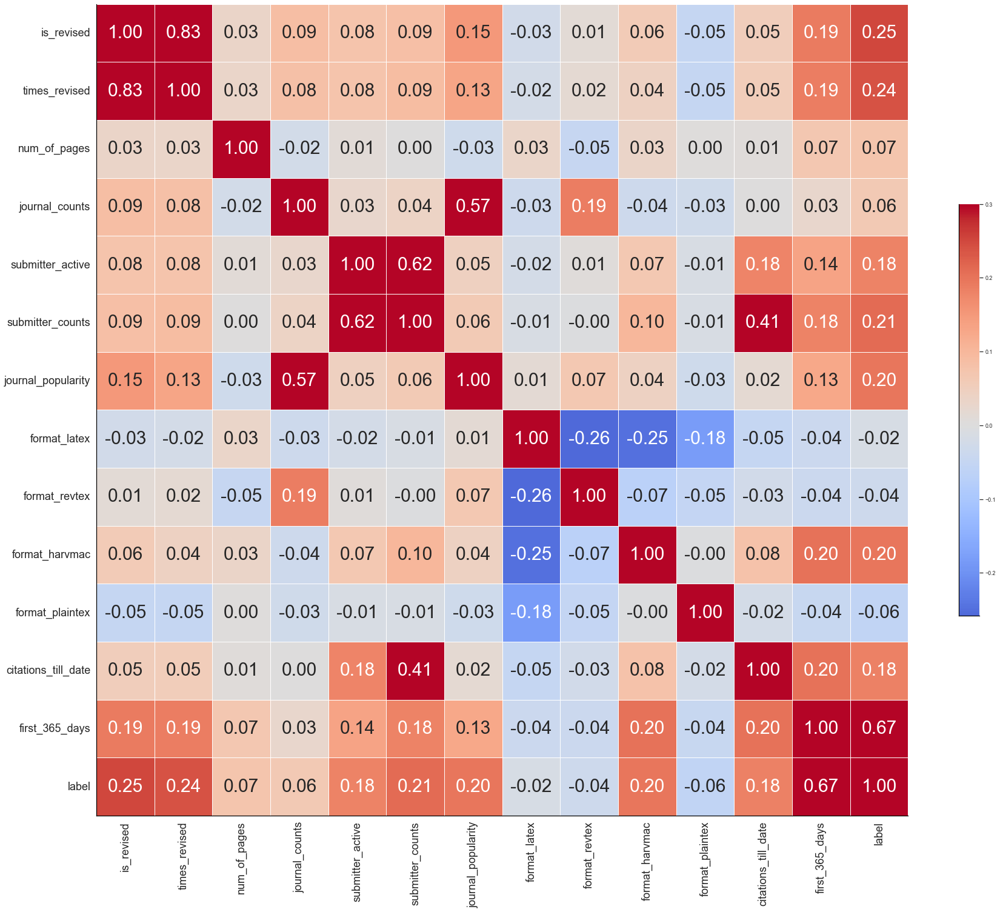

In [393]:
corr = df_metadata.drop(columns=['paper_id']).corr()
g = sns.heatmap(corr,  vmax=.3, center=0,
                square = True, linewidths=.5,
                cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
sns.despine()
g.figure.set_size_inches(30,25)
g.set_xticklabels(g.get_xmajorticklabels(), fontsize = 18)
g.set_yticklabels(g.get_ymajorticklabels(), fontsize = 18)
plt.show()
#g.figure.savefig("../reports/figures/metadata_features_corr.png")

In [336]:
df_num_corr = df_s.corr()['label'][1:-2]
features_list = df_num_corr.sort_values(ascending = False)
features_list

outdegree                              0.393536
outdegrees_of_cited_papers_sum         0.359609
outdegrees_of_cited_papers_avg         0.325896
indegrees_of_cited_papers_sum          0.268710
is_revised                             0.251059
times_revised                          0.239503
max_time_difference_bw_cited_papers    0.234262
format_harvmac                         0.196909
citations_till_date                    0.182582
indegrees_of_cited_papers_avg          0.154506
num_of_pages                           0.074088
format_latex                          -0.015736
format_revtex                         -0.035473
format_plaintex                       -0.056552
recency_of_cited_papers_avg           -0.114179
Name: label, dtype: float64

### Power Law Graphs

In [252]:
from scipy.stats import powerlaw
import powerlaw

Values less than or equal to 0 in data. Throwing out 0 or negative values
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Calculating best minimal value for power law fit


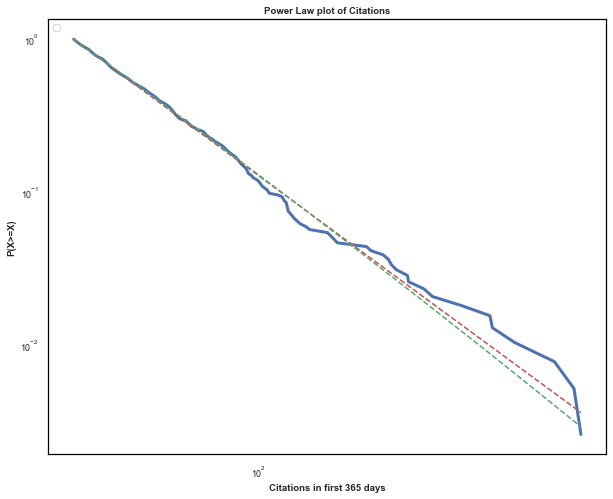

In [424]:
results = powerlaw.Fit(df_s['first_365_days'],discrete=True)
fig1 = results.plot_ccdf(linewidth=3)
results.power_law.plot_ccdf(ax=fig1, color='r', linestyle='--')
results.lognormal.plot_ccdf(ax=fig1, color='g', linestyle='--')


plt.title('Power Law plot of Citations', fontweight='bold')
plt.xlabel('Citations in first 365 days', fontweight='bold')
plt.ylabel('P(X>=X)', fontweight='bold')
plt.legend(loc="upper left")
#plt.savefig("../reports/figures/power_law_cit.png")

Number of papers per submitter

In [238]:
submitter_count = pd.DataFrame(df.groupby('submitter_details')[['paper_id']].count().reset_index())
submitter_count.sort_values('paper_id',ascending = False)

,submitter_details,paper_id
54,a.tseytlin@ic.ac.uk,60
8261,snojiri@yukawa.kyotou.ac.jp,56
7051,pope@absinthe.physics.tamu.edu,50
9137,vafa@string.harvard.edu,47
5084,linde@physics.stanford.edu,45
...,...,...
1755,dappiaggi@pv.infn.it,1
5601,matthias@feynman.harvard.edu,1
5600,matthias@amoco.saclay.cea.fr,1
5598,matthias.schmidt@itp.unileipzig.de,1


In [287]:
len(df['submitter_details'].unique())

9904

### Extract features from date

In [184]:
df['date_added_graph'] = pd.to_datetime(df['date_added_graph'])

In [215]:
df['year'] = df.date_added_graph.dt.year
df['month'] = df.date_added_graph.dt.month
df['quarter'] = df.date_added_graph.dt.quarter
df = df.loc[(df['year']>=1992) & (df['year']<=2002)]

In [210]:
subset_df = df[['paper_id','year']].groupby('year').count()
subset_df = pd.DataFrame(subset_df.reset_index())

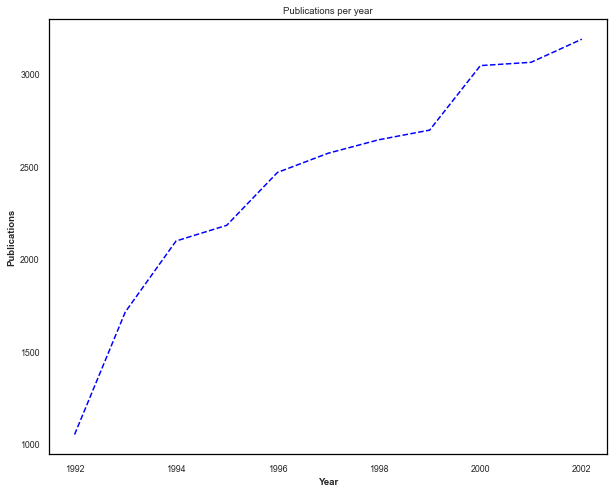

In [396]:
plt.rcParams["figure.figsize"] = (10,8)
plt.figure(facecolor='white')
g = plt.plot(subset_df['year'],subset_df['paper_id'], color='blue', linestyle='--')

plt.title('Publications per year')
plt.xlabel('Year', fontweight='bold')
plt.ylabel('Publications', fontweight='bold')
#plt.savefig("../reports/figures/publications_trend.png")
plt.show()

In [310]:
df_num_corr = df_s.corr()['label'][:-2]
features_list = df_num_corr.sort_values(ascending=False)
features_list

outdegree                              0.393536
outdegrees_of_cited_papers_sum         0.359609
outdegrees_of_cited_papers_avg         0.325896
indegrees_of_cited_papers_sum          0.268710
is_revised                             0.251059
times_revised                          0.239503
max_time_difference_bw_cited_papers    0.234262
format_harvmac                         0.196909
citations_till_date                    0.182582
indegrees_of_cited_papers_avg          0.154506
num_of_pages                           0.074088
format_latex                          -0.015736
format_revtex                         -0.035473
format_plaintex                       -0.056552
paper_id                              -0.080856
recency_of_cited_papers_avg           -0.114179
Name: label, dtype: float64

In [ ]:
df_num_corr = df_s.corr()['label'][:-2]
features_list = df_num_corr.sort_values(ascending=False)
features_list

In [136]:
df_numerical = list(df_s.select_dtypes(include = ['float64', 'int64']))
df_num = df[df_numerical]
df_num = df_num.drop(columns = ['is_revised','format_latex','format_revtex','format_harvmac','format_plaintex'])
df_num.head()

,paper_id,indegrees_of_cited_papers_sum,indegrees_of_cited_papers_avg,recency_of_cited_papers_avg,max_time_difference_bw_cited_papers,outdegree,outdegrees_of_cited_papers_sum,outdegrees_of_cited_papers_avg,times_revised,num_of_pages,first_365_days,citations_till_date,label
0,9509012,317,31.700000,523.000000,947.0,10,99,9.900000,1,15.0,2.0,2,1.0
1,9505051,175,19.444444,146.333333,448.0,9,86,9.555556,0,13.0,16.0,23,2.0
2,9508141,39,6.500000,705.000000,959.0,6,11,1.833333,0,16.0,0.0,1,0.0
3,9508159,222,20.181818,273.272727,909.0,11,116,10.545455,0,10.0,1.0,20,1.0
4,9501050,14,4.666667,357.333333,459.0,3,10,3.333333,0,1.0,1.0,0,1.0


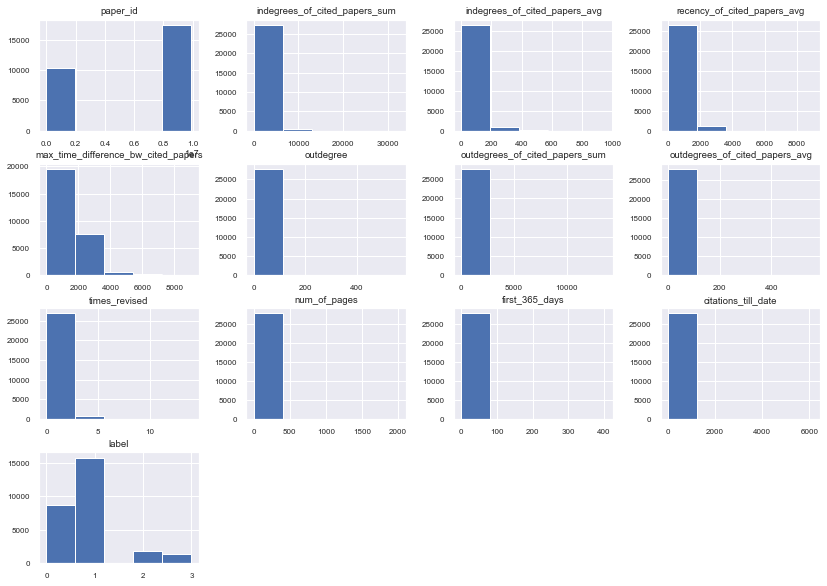

In [137]:
df_num.hist(figsize=(14, 10), bins=5, xlabelsize=8, ylabelsize=8);

In [138]:
graph_features = df[['indegrees_of_cited_papers_sum','indegrees_of_cited_papers_avg',
                     'recency_of_cited_papers_avg','max_time_difference_bw_cited_papers', 'outdegree',
                     'outdegrees_of_cited_papers_sum', 'outdegrees_of_cited_papers_avg','date_added_graph','label_name']]

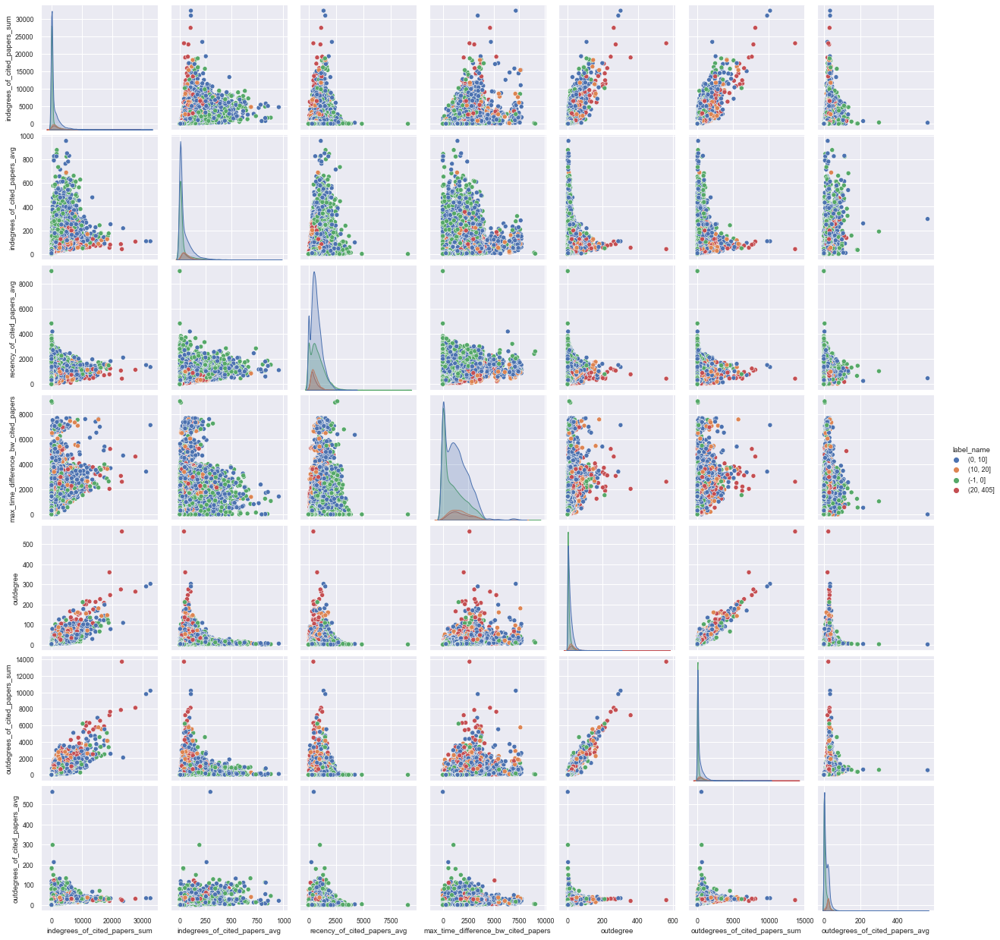

In [139]:
sns.pairplot(graph_features, hue = 'label_name')

<AxesSubplot:xlabel='date_added_graph'>

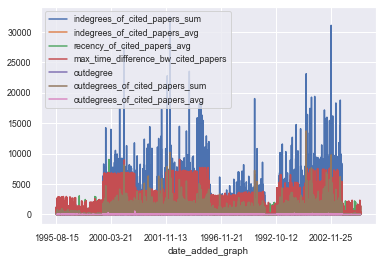

In [106]:
graph_features.set_index('date_added_graph').plot()

In [172]:
imp_features_df = df[['recency_of_cited_papers_avg', 'outdegrees_of_cited_papers_sum',
                     'outdegrees_of_cited_papers_avg','max_time_difference_bw_cited_papers',
                     'indegrees_of_cited_papers_sum', 'indegrees_of_cited_papers_avg',
                     'outdegree','date_added_graph','label_name']]

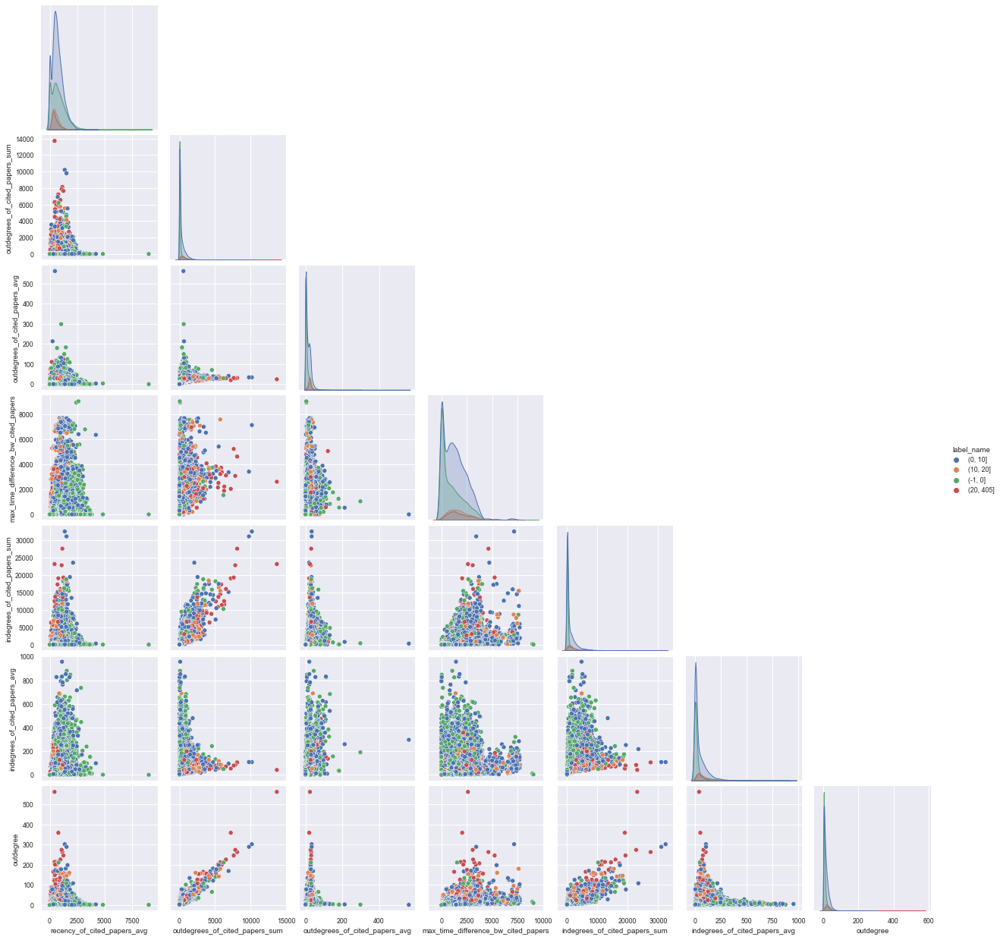

In [173]:
g = sns.pairplot(imp_features_df, hue = 'label_name', height = 2.5, corner = True)

In [174]:
imp_features_top3_rf = df[['recency_of_cited_papers_avg','outdegrees_of_cited_papers_sum',
                     'outdegrees_of_cited_papers_avg','date_added_graph','label_name']]

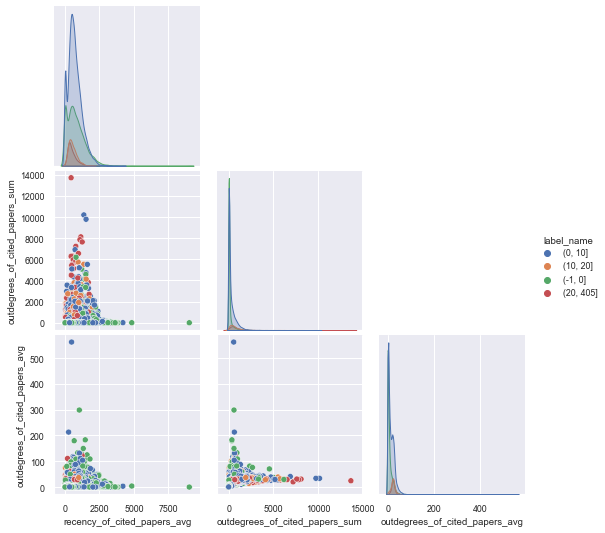

In [175]:
g = sns.pairplot(imp_features_top3_rf, hue = 'label_name', height = 2.5, corner = True)

In [176]:
imp_features_top3_gb = df[['max_time_difference_bw_cited_papers','outdegrees_of_cited_papers_sum',
                           'indegrees_of_cited_papers_avg','date_added_graph','label_name']]

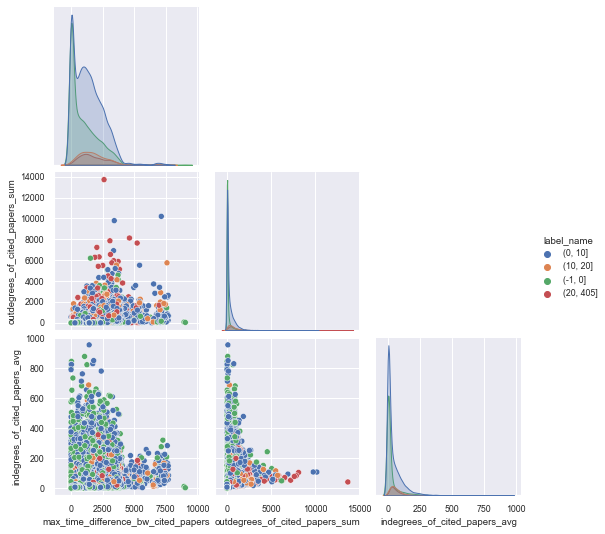

In [177]:
g = sns.pairplot(imp_features_top3_gb, hue = 'label_name', height = 2.5, corner = True)

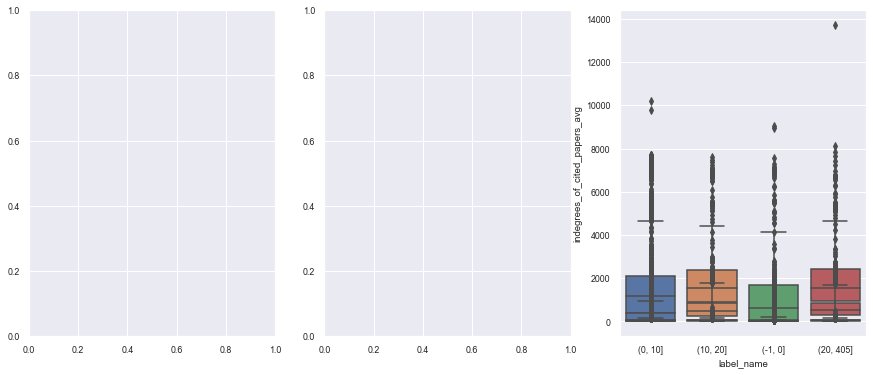

In [182]:
top3_gb = ['max_time_difference_bw_cited_papers','outdegrees_of_cited_papers_sum','indegrees_of_cited_papers_avg']

f, axes = plt.subplots(1, 3, figsize = (15,6))
for feature in top3_gb:
    sns.boxplot(x="label_name", y = feature, data = imp_features_top3_gb)

### Plot graph

### Node Statistics

In [ ]:
df_graph_degree_centrality = pd.DataFrame({'paper_id': degree_centrality_graph.keys(),
                                           'degree_centrality': degree_centrality_graph.values()})
df_graph_degree_centrality = pd.merge(df_graph_degree_centrality, df['paper_id','date_added_graph'], left_on=['paper_id'], right_on = ['paper_id']) 
df_graph_degree_centrality

In [ ]:
df_graph_degree_centrality.sort_values('degree_centrality', ascending = False)

**Eigencentrality**: Measures the importance of a node based on its neighbors.

In [ ]:
eigen_centrality_graph = nx.eigenvector_centrality(G, tol=1e-03)

plt.figure(figsize=(16,6))
plt.hist([np.log(list(eigen_centrality_graph.values()))], label=['graph'])
plt.legend(loc='upper right')
plt.ylabel('frequency')
plt.xlabel('log degree')
plt.show()

In [107]:
list(G.nodes())[0:5]

[1001, 9304045, 9308122, 9309097, 9311042]

In [108]:
len(G.nodes())

27770

In [117]:
G.nodes(data = True)

NodeDataView({1001: {'time': datetime.date(2000, 1, 4)}, 9304045: {'time': datetime.date(1993, 4, 13)}, 9308122: {'time': datetime.date(1993, 8, 30)}, 9309097: {'time': datetime.date(1993, 9, 24)}, 9311042: {'time': datetime.date(1993, 11, 12)}, 9401139: {'time': datetime.date(1994, 2, 4)}, 9404151: {'time': datetime.date(1994, 4, 26)}, 9407087: {'time': datetime.date(1994, 7, 19)}, 9408099: {'time': datetime.date(1994, 8, 19)}, 9501030: {'time': datetime.date(1995, 1, 12)}, 9503124: {'time': datetime.date(1995, 3, 21)}, 9504090: {'time': datetime.date(1995, 4, 19)}, 9504145: {'time': datetime.date(1995, 4, 28)}, 9505025: {'time': datetime.date(1995, 5, 5)}, 9505054: {'time': datetime.date(1995, 5, 11)}, 9505105: {'time': datetime.date(1995, 5, 19)}, 9505162: {'time': datetime.date(1995, 5, 30)}, 9506048: {'time': datetime.date(1995, 6, 13)}, 9506112: {'time': datetime.date(1995, 6, 19)}, 9506144: {'time': datetime.date(1995, 6, 23)}, 9507050: {'time': datetime.date(1995, 7, 11)}, 9507

In [144]:
list(G.neighbors(9711200))

[9204099,
 9209116,
 9307049,
 9508072,
 9510134,
 9512059,
 9601029,
 9602022,
 9602051,
 9602065,
 9602135,
 9603003,
 9603109,
 9604089,
 9606185,
 9607112,
 9607149,
 9608108,
 9609026,
 9610043,
 9610172,
 9611125,
 9612051,
 9612080,
 9702015,
 9702076,
 9702187,
 9703031,
 9703040,
 9704005,
 9704112,
 9705057,
 9705117,
 9705190,
 9705192,
 9705221,
 9706072,
 9706100,
 9706192,
 9707079,
 9707093,
 9707158,
 9707188,
 9708005,
 9708099,
 9709091,
 9709099,
 9709220,
 9710009,
 9710014,
 9711002,
 9711037,
 9711053,
 9711072]

In [143]:
degree_centrality_graph = nx.degree_centrality(G)

df_graph_degree_centrality = pd.DataFrame({'paper_id': degree_centrality_graph.keys(),
                                           'degree_centrality': degree_centrality_graph.values()})
df_graph_degree_centrality = pd.merge(df_graph_degree_centrality, df[['paper_id','date_added_graph','title']], left_on=['paper_id'], right_on = ['paper_id']) 
df_graph_degree_centrality.sort_values('degree_centrality', ascending = False)

,paper_id,degree_centrality,date_added_graph,title
178,9711200,0.088876,1997-11-28,The Large N Limit of Superconformal Field Theo...
224,9802150,0.064712,1998-02-23,Anti De Sitter Space And Holography
223,9802109,0.059527,1998-02-17,Gauge Theory Correlators from Non-Critical Str...
669,9905111,0.049264,1999-05-17,"Large N Field Theories, String Theory and Gravity"
7,9407087,0.047103,1994-07-19,"Monopole Condensation, And Confinement In N=2 ..."
...,...,...,...,...
23354,9501008,0.000036,1995-01-09,On Abelian Bosonization of Free Fermi Fields i...
19744,9705042,0.000036,1997-05-08,Irreversible Quantum Mechanics in the Neutral ...
19743,212282,0.000036,2002-12-24,Time Asymmetric Quantum Theory - III. Decaying...
19741,212280,0.000036,2002-12-24,Time Asymmetric Quantum Theory - II. Relativis...


In [149]:
depths_graph = nx.shortest_path_length(G, source=9711200)
depth_of_tree_graph = max(depths_graph.values())
depth_of_tree_graph

13

In [160]:
neighbors_graph_degree = [n for n in G.neighbors(9711200)]

list_neighbors_graph_degree = [df[df['paper_id'] == n]['title'] for n in neighbors_graph_degree]

print(f'Number of neigbors of the node in the original graph with the highest degree: {len(list_neighbors_graph_degree)}')
print(list_neighbors_graph_degree, end=" ")

Number of neigbors of the node in the original graph with the highest degree: 54
[19974    The Black Hole in Three Dimensional Space Time
Name: title, dtype: object, 19859    Dilaton Black Holes Near the Horizon
Name: title, dtype: object, 27093    Vacuum interpolation in supergravity via super...
Name: title, dtype: object, 1022    N=2 Extremal Black Holes
Name: title, dtype: object, 874    Extremal Black Holes As Fundamental Strings
Name: title, dtype: object, 2110    Open P-Branes
Name: title, dtype: object, 15552    Microscopic Origin of the Bekenstein-Hawking E...
Name: title, dtype: object, 16199    Evidence for F-Theory
Name: title, dtype: object, 15660    Counting States of Near-Extremal Black Holes
Name: title, dtype: object, 15658    D--branes and Spinning Black Holes
Name: title, dtype: object, 14745    Entropy and Temperature of Black 3-Branes
Name: title, dtype: object, 16275    Comments on String Dynamics in Six Dimensions
Name: title, dtype: object, 15147    Nonextremal 

C:\Users\Sharan Shyamsundar\AppData\Local\Temp\ipykernel_29772\4281249519.py:4: RuntimeWarning: divide by zero encountered in log
  ls_degree_centrality_graph = np.log(list(degree_centrality_graph.values()))


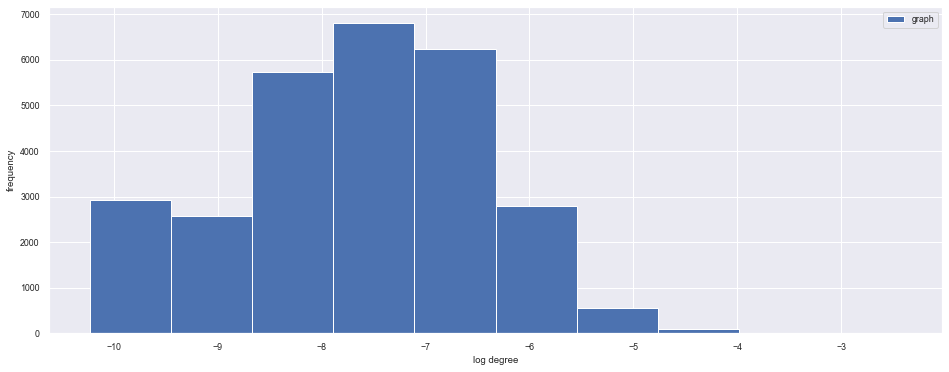

In [169]:
degree_centrality_graph = nx.degree_centrality(G)

plt.figure(figsize=(16,6))
ls_degree_centrality_graph = np.log(list(degree_centrality_graph.values()))
z = ls_degree_centrality_graph[np.isfinite(ls_degree_centrality_graph)]
plt.hist([z], label=['graph'])
plt.legend(loc='upper right')
plt.ylabel('frequency')
plt.xlabel('log degree')
plt.show()

In [158]:
df.sort_values('indegrees_of_cited_papers_avg', ascending = False)

,paper_id,indegrees_of_cited_papers_sum,indegrees_of_cited_papers_avg,recency_of_cited_papers_avg,max_time_difference_bw_cited_papers,outdegree,outdegrees_of_cited_papers_sum,outdegrees_of_cited_papers_avg,submitter,submission_date,...,submitter_active,submitter_counts,journal_popularity,format_latex,format_revtex,format_harvmac,format_plaintex,date_added_graph,datedelta,citations_till_date
23403,203167,4783,956.600000,1120.200000,1434.0,5,105,21.000000,charles b. thorn <thorn@phys.ufl.edu>,"tue, 19 mar 2002 17:20:02 gmt (25kb) date (r...",...,1,10,0,0,0,0,0,2002-03-20,1.0,29
7081,9040,1759,879.500000,1549.500000,1071.0,2,90,45.000000,chuantsung chan <ctchan@phys.ntu.edu.tw>,"tue, 5 sep 2000 23:54:05 gmt (13kb)",...,0,1,0,0,1,0,0,2000-09-07,2.0,0
25381,205001,5110,851.666667,1459.833333,1792.0,6,126,21.000000,don n. page <don@phys.ualberta.ca>,"tue, 30 apr 2002 22:38:16 gmt (8kb)",...,0,4,0,1,0,0,0,2002-05-02,2.0,18
20997,9909158,1693,846.500000,1876.500000,31.0,2,16,8.000000,a. demichev <mcvisito@pcu.helsinki.fi>,"wed, 22 sep 1999 16:44:42 gmt (11kb)",...,1,5,0,1,0,0,0,1999-09-23,1.0,9
24628,210051,5815,830.714286,1117.714286,1721.0,7,778,111.142857,debashis gangopadhyay <debashis@bose.res.in>,"sat, 5 oct 2002 07:36:09 gmt (6kb)",...,0,4,0,1,0,0,0,2002-10-08,3.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15733,9610071,0,0.000000,0.000000,0.0,0,0,0.000000,bbsp@uohyd.ernet.in (dr bindu a bhamba),"thu, 10 oct 1996 15:38:59 -0500 (12kb)",...,0,1,1,0,0,0,0,1996-10-11,1.0,0
4980,7093,0,0.000000,0.000000,0.0,0,0,0.000000,patrizia vitale <patrizia.vitale@na.infn.it>,"wed, 12 jul 2000 10:47:25 gmt (22kb) date (r...",...,1,5,1,0,1,0,0,2000-07-13,1.0,7
21510,9905189,0,0.000000,217.000000,0.0,1,1,1.000000,hitoshi miyazaki <miyazaki@tanashi.kek.jp>,"wed, 26 may 1999 02:39:33 gmt (47kb)",...,0,2,0,0,0,0,0,1999-05-27,1.0,0
2674,9409134,0,0.000000,70.000000,0.0,1,1,1.000000,"""d.v.ahluwalia, lanl, 505 665 4278"" <av@lampf....","thu, 22 sep 1994 15:54:48 -0600 (mdt) (22kb)...",...,1,8,1,0,1,0,0,1994-09-27,5.0,5


In [155]:
nx.spring_layout(G)
nx.draw(G, with_labels=False, node_color="skyblue", alpha=0.5, linewidths=2)
plt.figure(figsize=(16,8))
plt.draw()
#plt.savefig("graph.png", dpi=500, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format=None,transparent=False, bbox_inches=None, pad_inches=0.1) 

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x0000019C463589D0> (for post_execute):


KeyboardInterrupt: 